# GTCRN vs Wiener 25 ms Focus

This notebook isolates four systems for detailed comparison across the DNS challenge test set:
- **Noisy Baseline**
- **WF 25 ms Default (mu = 0.98)**
- **GTCRN (No WF)**
- **GTCRN + WF 25 ms (mu = 0.98)**

## Experiment Catalogue

In [13]:
import warnings
from pathlib import Path
from typing import List, Optional

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import display

# Configure paths
repo_root = Path.cwd().parent.parent
exp3_root = repo_root / "results" / "EXP3" / "GTCRN"
wf25_root = repo_root / "results" / "EXP1" / "wiener" / "WF_EXP1p1d"
baseline_root = repo_root / "results" / "BASELINE" / "NOIZEUS_EARS_BASELINE"
figures_dir = repo_root / "reports" / "figures" / "GTCRNWF_EXP3p2a_focus"
figures_dir.mkdir(parents=True, exist_ok=True)

snr_levels = [-5, 0, 5, 10, 15]
metrics_of_interest = ["PESQ", "STOI", "SI_SDR", "DNSMOS_mos_ovr"]

warnings.simplefilter("ignore", category=FutureWarning)
sns.set_theme(style="whitegrid")
plt.rcParams.update({
    "figure.dpi": 300,
    "font.size": 14,
    "axes.labelsize": 14,
    "axes.titlesize": 16,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 12,
})

In [14]:
catalog = {
    "BASELINE_NOIZEUS_EARS": {
        "label": "Noisy Baseline",
        "frame_ms": None,
        "mu": None,
        "focus": "No Enhancement",
        "directory": baseline_root,
        "template": "BASELINE_NOIZEUS_EARS_[{snr}]dB.csv",
    },
    "WF_EXP1p1d": {
        "label": "WF 25 ms Default (mu=0.98)",
        "frame_ms": 25,
        "mu": 0.98,
        "focus": "Classical WF",
        "directory": wf25_root,
        "template": "WF_EXP1p1d_merged_[{snr}]dB.csv",
    },
    "GTCRN_EXP3p2a": {
        "label": "GTCRN (No WF)",
        "frame_ms": None,
        "mu": None,
        "focus": "Neural",
        "directory": exp3_root / "GTCRN_EXP3p2a",
        "template": "GTCRN_EXP3p2a_merged_[{snr}]dB.csv",
    },
    "GTCRNWF_EXP3p2a_25ms_quality": {
        "label": "GTCRN+WF 25 ms (mu=0.98)",
        "frame_ms": 25,
        "mu": 0.98,
        "focus": "Hybrid",
        "directory": exp3_root / "GTCRNWF_EXP3p2a_25ms_quality",
        "template": "GTCRNWF_EXP3p2a_25ms_quality_merged_[{snr}]dB.csv",
    },
}

meta_fields = ["label", "frame_ms", "mu", "focus"]

## Load and Summarise Metrics

In [15]:
def load_experiment(prefix: str, meta: dict) -> pd.DataFrame:
    frames = []
    directory = meta["directory"]
    template = meta["template"]
    for snr in snr_levels:
        csv_path = directory / template.format(snr=snr)
        df = pd.read_csv(csv_path)
        df["SNR"] = snr
        df["experiment"] = prefix
        frames.append(df)
    result = pd.concat(frames, ignore_index=True)
    if "enhanced_file" in result.columns:
        result["noise_type"] = result["enhanced_file"].str.extract(r"NOIZEUS_NOISE_DATASET_(.*?)_SNR")
    else:
        result["noise_type"] = np.nan
    return result

def build_summary_tables() -> tuple[pd.DataFrame, pd.DataFrame]:
    all_frames = []
    summaries = []
    for exp_name, meta in catalog.items():
        df = load_experiment(exp_name, meta)
        for field in meta_fields:
            df[field] = meta.get(field)
        all_frames.append(df)

        summary = df.groupby("SNR")[metrics_of_interest].mean().reset_index()
        summary["experiment"] = exp_name
        for field in meta_fields:
            summary[field] = meta.get(field)
        summaries.append(summary)
    full_df = pd.concat(all_frames, ignore_index=True)
    summary_df = pd.concat(summaries, ignore_index=True)
    return full_df, summary_df

full_results, summary_by_snr = build_summary_tables()
summary_by_snr.head()

,SNR,PESQ,STOI,SI_SDR,DNSMOS_mos_ovr,experiment,label,frame_ms,mu,focus
0,-5,1.065751,0.586570,-4.989893,1.970603,BASELINE_NOIZEUS_EARS,Noisy Baseline,None,NaN,No Enhancement
1,0,1.093715,0.654918,-0.026259,2.263054,BASELINE_NOIZEUS_EARS,Noisy Baseline,None,NaN,No Enhancement
2,5,1.173282,0.715255,4.995548,2.436134,BASELINE_NOIZEUS_EARS,Noisy Baseline,None,NaN,No Enhancement
3,10,1.344649,0.773980,9.999116,2.638218,BASELINE_NOIZEUS_EARS,Noisy Baseline,None,NaN,No Enhancement
4,15,1.646841,0.813742,14.998889,2.748197,BASELINE_NOIZEUS_EARS,Noisy Baseline,None,NaN,No Enhancement


In [16]:
label_map = {key: meta["label"] for key, meta in catalog.items()}
label_order = [label_map[key] for key in catalog]
label_lookup = {key: meta.get("label", key) for key, meta in catalog.items()}
meta_lookup = pd.DataFrame({
    key: {field: catalog[key].get(field) for field in meta_fields}
    for key in catalog
}).T
meta_lookup

,label,frame_ms,mu,focus
BASELINE_NOIZEUS_EARS,Noisy Baseline,None,None,No Enhancement
WF_EXP1p1d,WF 25 ms Default (mu=0.98),25,0.98,Classical WF
GTCRN_EXP3p2a,GTCRN (No WF),None,None,Neural
GTCRNWF_EXP3p2a_25ms_quality,GTCRN+WF 25 ms (mu=0.98),25,0.98,Hybrid


In [17]:
overall_mean = (
    summary_by_snr.groupby("experiment")[metrics_of_interest].mean()
    .join(meta_lookup)
    .reset_index()
    .rename(columns={"DNSMOS_mos_ovr": "DNSMOS"})
)
overall_mean.sort_values("DNSMOS", ascending=False)

,experiment,PESQ,STOI,SI_SDR,DNSMOS,label,frame_ms,mu,focus
1,GTCRNWF_EXP3p2a_25ms_quality,1.667798,0.717897,10.159786,2.932191,GTCRN+WF 25 ms (mu=0.98),25,0.98,Hybrid
2,GTCRN_EXP3p2a,1.730299,0.730913,11.048315,2.867137,GTCRN (No WF),None,None,Neural
3,WF_EXP1p1d,1.497260,0.711667,8.417473,2.444094,WF 25 ms Default (mu=0.98),25,0.98,Classical WF
0,BASELINE_NOIZEUS_EARS,1.264848,0.708893,4.995480,2.411241,Noisy Baseline,None,None,No Enhancement


## Percentage Gains vs GTCRN

In [18]:
def compute_percentage_gain(reference_key: str) -> pd.DataFrame:
    reference = summary_by_snr[summary_by_snr["experiment"] == reference_key]
    rows = []
    for exp_name in catalog:
        if exp_name == reference_key:
            continue
        exp_slice = summary_by_snr[summary_by_snr["experiment"] == exp_name]
        merged = exp_slice.merge(reference, on="SNR", suffixes=("", "_ref"))
        for metric in metrics_of_interest:
            delta = merged[metric] - merged[f"{metric}_ref"]
            pct = (delta / merged[f"{metric}_ref"]) * 100
            rows.append({
                "experiment": exp_name,
                "metric": metric,
                "avg_pct": pct.mean(),
            })
    pivot = pd.DataFrame(rows).pivot(index="experiment", columns="metric", values="avg_pct")
    pivot = pivot.rename(columns={"DNSMOS_mos_ovr": "DNSMOS"})
    pivot = pivot.join(meta_lookup[["label"]], how="left")
    return pivot[["label", "PESQ", "STOI", "SI_SDR", "DNSMOS"]].sort_values("DNSMOS", ascending=False)

pct_vs_gtcrn = compute_percentage_gain("GTCRN_EXP3p2a")
pct_vs_gtcrn

,label,PESQ,STOI,SI_SDR,DNSMOS
experiment,,,,,
GTCRNWF_EXP3p2a_25ms_quality,GTCRN+WF 25 ms (mu=0.98),-3.554113,-1.882486,-6.473756,2.412714
WF_EXP1p1d,WF 25 ms Default (mu=0.98),-13.717131,-2.747651,-37.671587,-13.788273
BASELINE_NOIZEUS_EARS,Noisy Baseline,-25.771551,-3.049100,-84.504915,-14.941249


## Best Configuration per Metric and SNR

In [19]:
metric_display = {
    "PESQ": "PESQ",
    "STOI": "STOI",
    "SI_SDR": "SI-SDR",
    "DNSMOS_mos_ovr": "DNSMOS",
}

def best_by_snr_with_gain(reference_key: str) -> pd.DataFrame:
    reference_slice = summary_by_snr[summary_by_snr["experiment"] == reference_key].set_index("SNR")
    rows = []
    for snr in snr_levels:
        snr_slice = summary_by_snr[summary_by_snr["SNR"] == snr]
        if snr_slice.empty:
            continue
        for metric in metrics_of_interest:
            best_idx = snr_slice[metric].idxmax()
            best_row = snr_slice.loc[best_idx]
            ref_value = reference_slice.loc[snr, metric] if snr in reference_slice.index else np.nan
            pct_gain = np.nan
            if pd.notnull(ref_value) and ref_value != 0:
                pct_gain = ((best_row[metric] - ref_value) / ref_value) * 100
            rows.append({
                "SNR (dB)": snr,
                "Metric": metric_display.get(metric, metric),
                "Best Config": label_lookup.get(best_row["experiment"], best_row["experiment"]),
                "Score": best_row[metric],
                "Reference": label_lookup.get(reference_key, reference_key),
                "Ref Score": ref_value,
                "Pct Gain (%)": pct_gain,
            })
    result = pd.DataFrame(rows)
    return result.sort_values(["SNR (dB)", "Metric"])

best_vs_gtcrn = best_by_snr_with_gain("GTCRN_EXP3p2a")
best_vs_gtcrn.round({"Score": 3, "Ref Score": 3, "Pct Gain (%)": 1})

,SNR (dB),Metric,Best Config,Score,Reference,Ref Score,Pct Gain (%)
3,-5,DNSMOS,GTCRN+WF 25 ms (mu=0.98),2.182,GTCRN (No WF),2.088,4.5
0,-5,PESQ,GTCRN (No WF),1.237,GTCRN (No WF),1.237,0.0
2,-5,SI-SDR,GTCRN (No WF),4.155,GTCRN (No WF),4.155,0.0
1,-5,STOI,GTCRN (No WF),0.605,GTCRN (No WF),0.605,0.0
7,0,DNSMOS,GTCRN+WF 25 ms (mu=0.98),2.621,GTCRN (No WF),2.576,1.7
4,0,PESQ,GTCRN (No WF),1.445,GTCRN (No WF),1.445,0.0
6,0,SI-SDR,GTCRN (No WF),7.608,GTCRN (No WF),7.608,0.0
5,0,STOI,GTCRN (No WF),0.677,GTCRN (No WF),0.677,0.0
11,5,DNSMOS,GTCRN+WF 25 ms (mu=0.98),2.977,GTCRN (No WF),2.911,2.3
8,5,PESQ,GTCRN (No WF),1.659,GTCRN (No WF),1.659,0.0


## Metric Trends vs SNR

WindowsPath('c:/Users/kapun_63wn2un/Documents/ELEN4012 - Investigation/Repository/PROJECT-25P85/reports/figures/GTCRNWF_EXP3p2a_focus/gtcrnwf_focus_metric_trends.png')

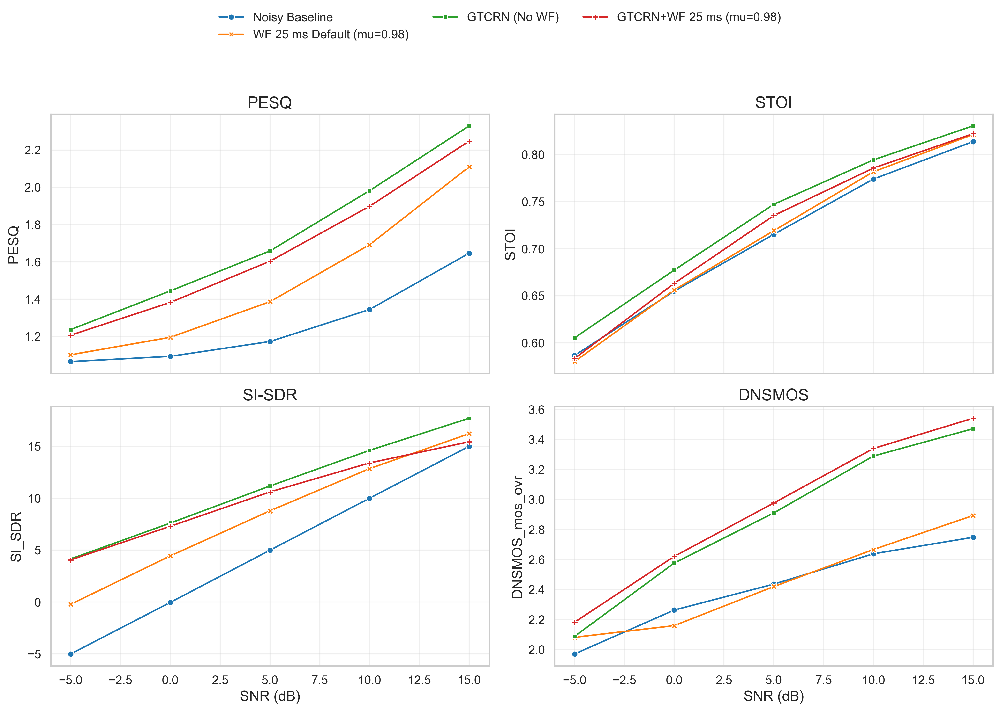

In [20]:
palette = sns.color_palette("tab10", len(catalog))
plot_df = summary_by_snr.copy()
plot_df["label"] = plot_df["experiment"].map(label_map)

fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
axes = axes.flatten()

for idx, metric in enumerate(metrics_of_interest):
    ax = axes[idx]
    sns.lineplot(
        data=plot_df,
        x="SNR",
        y=metric,
        hue="label",
        style="label",
        markers=True,
        dashes=False,
        palette=palette,
        hue_order=label_order,
        style_order=label_order,
        ax=ax,
    )
    ax.set_title(metric_display.get(metric, metric))
    ax.set_xlabel("SNR (dB)")
    ax.legend().remove()
    ax.grid(True, alpha=0.3)

handles, labels = axes[0].get_legend_handles_labels()
fig.tight_layout(rect=[0, 0, 1, 0.88])
fig.legend(handles, labels, loc="upper center", ncol=3, frameon=False, bbox_to_anchor=(0.5, 0.99))
trend_path = figures_dir / "gtcrnwf_focus_metric_trends.png"
fig.savefig(trend_path, bbox_inches="tight")
trend_path

## DNSMOS per SNR

WindowsPath('c:/Users/kapun_63wn2un/Documents/ELEN4012 - Investigation/Repository/PROJECT-25P85/reports/figures/GTCRNWF_EXP3p2a_focus/gtcrnwf_focus_dnsmos_bars.png')

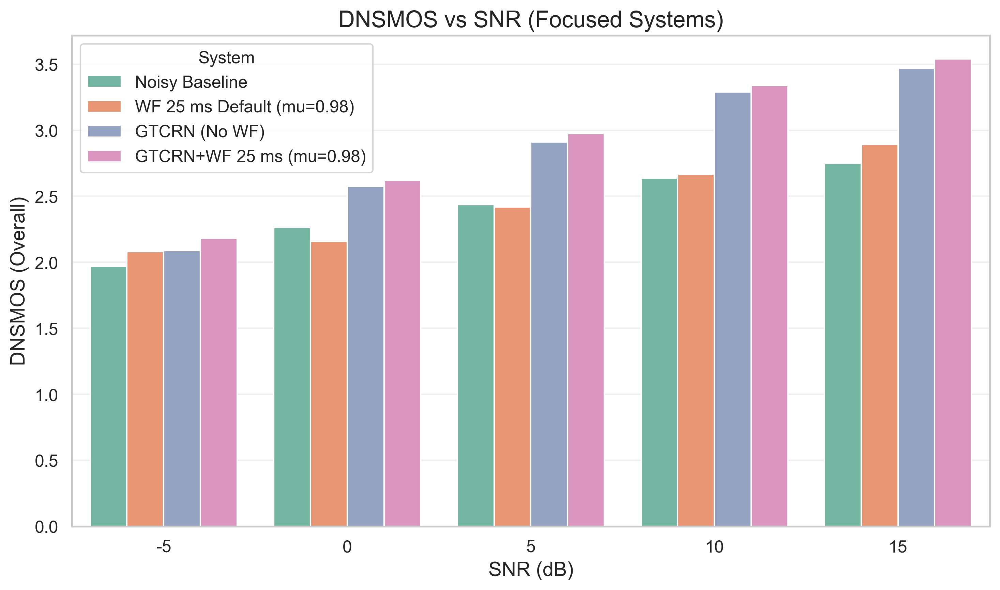

In [21]:
bar_metric = "DNSMOS_mos_ovr"
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(
    data=plot_df,
    x="SNR",
    y=bar_metric,
    hue="label",
    order=snr_levels,
    hue_order=label_order,
    palette="Set2",
    ax=ax,
)
ax.set_xlabel("SNR (dB)")
ax.set_ylabel("DNSMOS (Overall)")
ax.set_title("DNSMOS vs SNR (Focused Systems)")
ax.grid(True, axis="y", alpha=0.3)
ax.legend(title="System", loc="best")
fig.tight_layout()
bars_path = figures_dir / "gtcrnwf_focus_dnsmos_bars.png"
fig.savefig(bars_path, bbox_inches="tight")
bars_path

## Noise-Type Breakdown

In [22]:
noise_breakdown = (
    full_results.dropna(subset=["noise_type"])
    .groupby(["noise_type", "SNR", "experiment"], as_index=False)[metrics_of_interest]
    .mean()
)
noise_breakdown["label"] = noise_breakdown["experiment"].map(label_map)
noise_breakdown = noise_breakdown.sort_values(["noise_type", "SNR", "label"])
noise_breakdown.head()

,noise_type,SNR,experiment,PESQ,STOI,SI_SDR,DNSMOS_mos_ovr,label
2,Car Noise_60mph,-5,GTCRN_EXP3p2a,1.219851,0.641811,4.988284,2.558415,GTCRN (No WF)
1,Car Noise_60mph,-5,GTCRNWF_EXP3p2a_25ms_quality,1.176497,0.620232,4.752046,2.364880,GTCRN+WF 25 ms (mu=0.98)
0,Car Noise_60mph,-5,BASELINE_NOIZEUS_EARS,1.061041,0.633801,-4.987777,2.621103,Noisy Baseline
3,Car Noise_60mph,-5,WF_EXP1p1d,1.122713,0.621214,1.540637,2.130068,WF 25 ms Default (mu=0.98)
6,Car Noise_60mph,0,GTCRN_EXP3p2a,1.515823,0.685985,9.106085,2.733025,GTCRN (No WF)


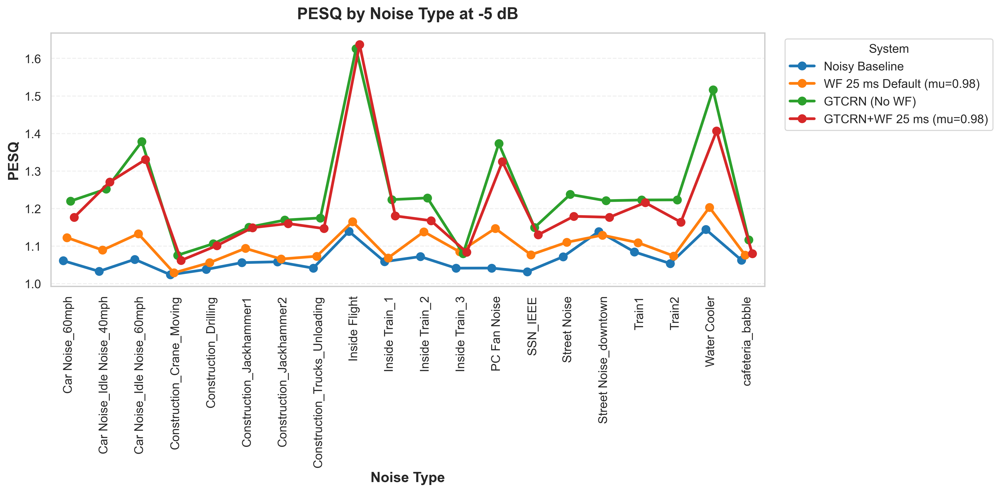

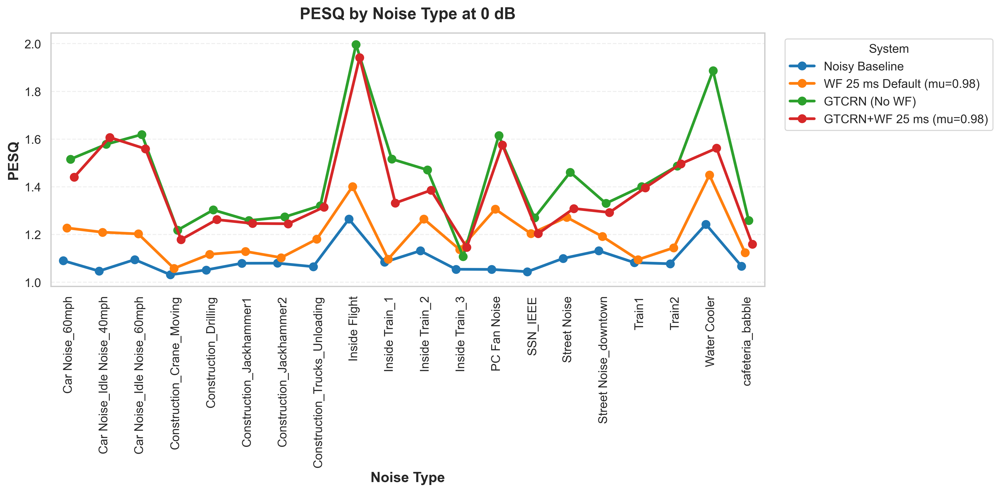

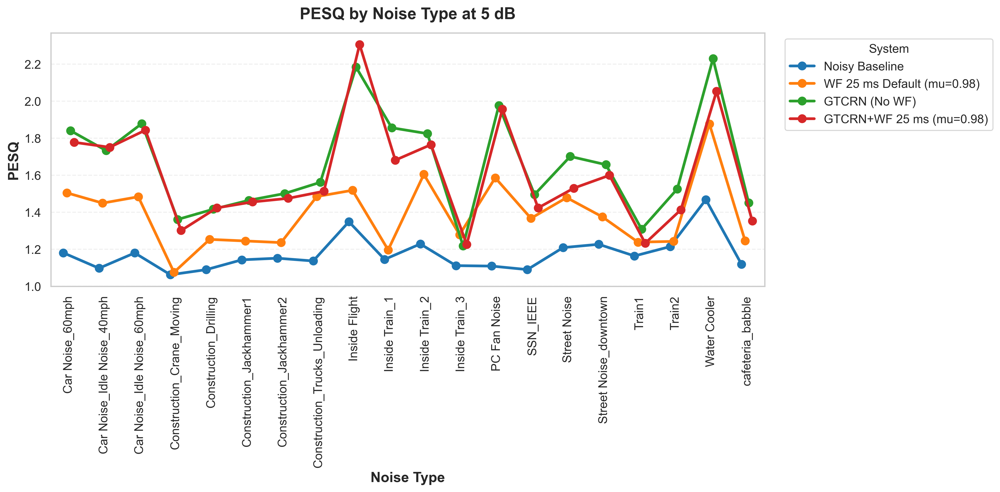

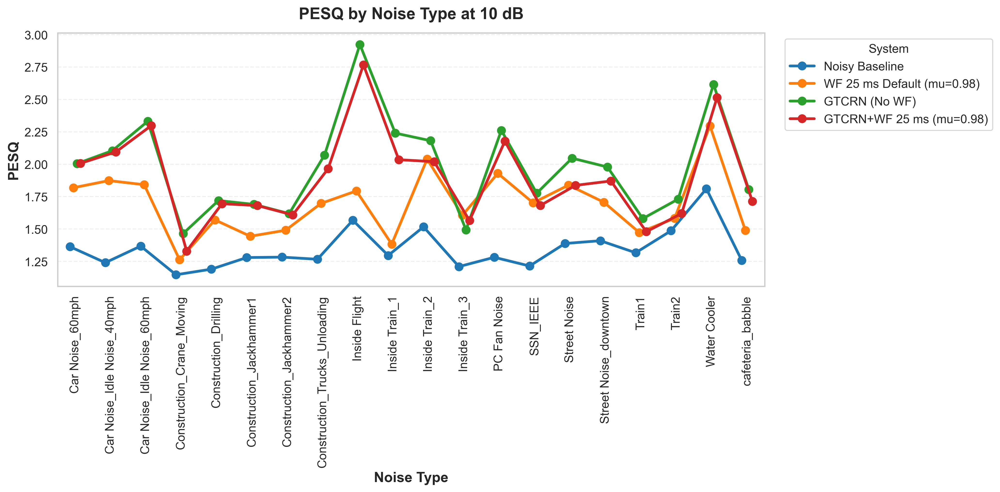

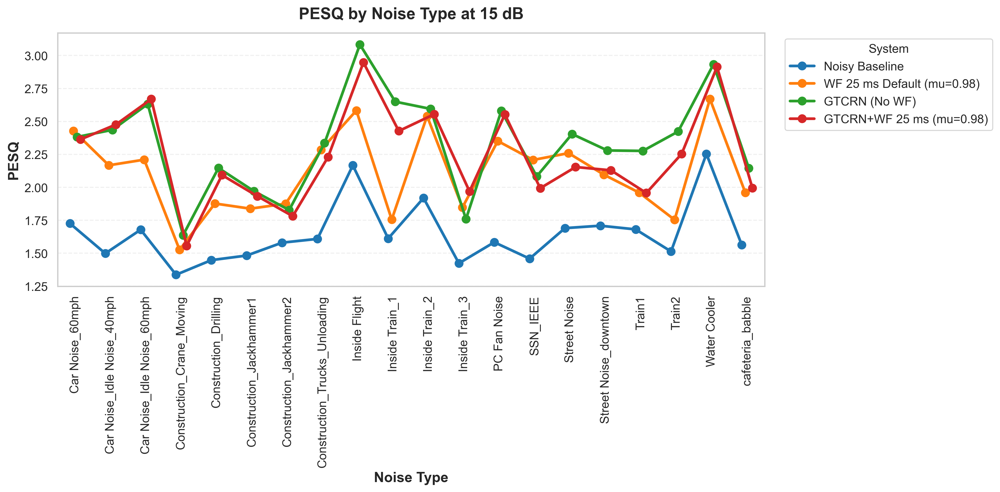

...

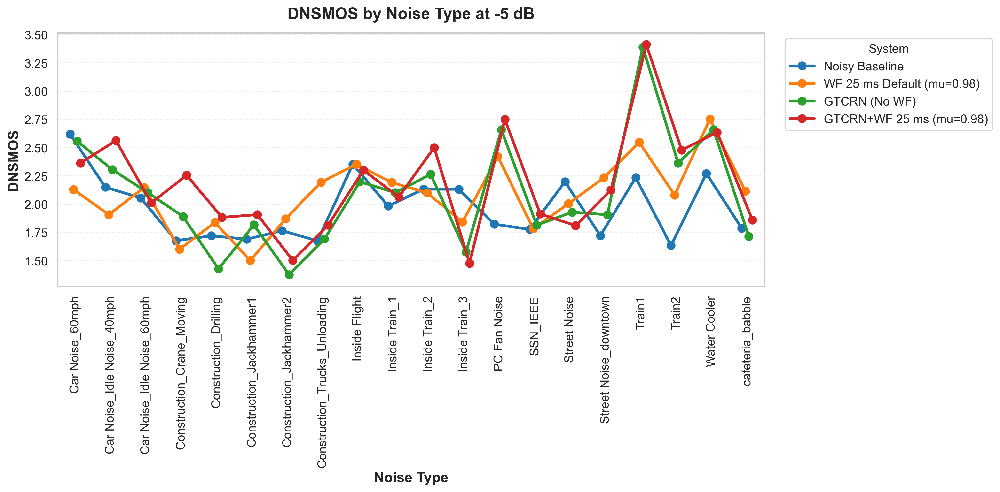

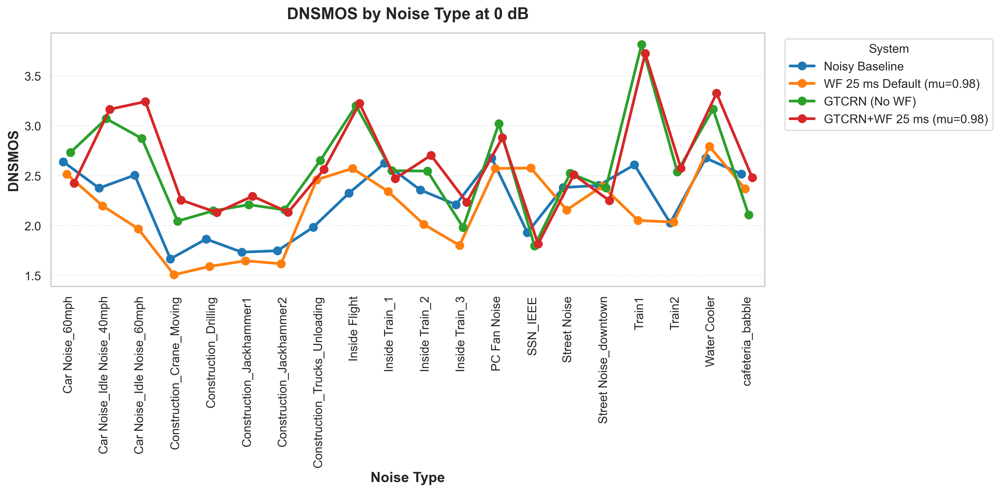

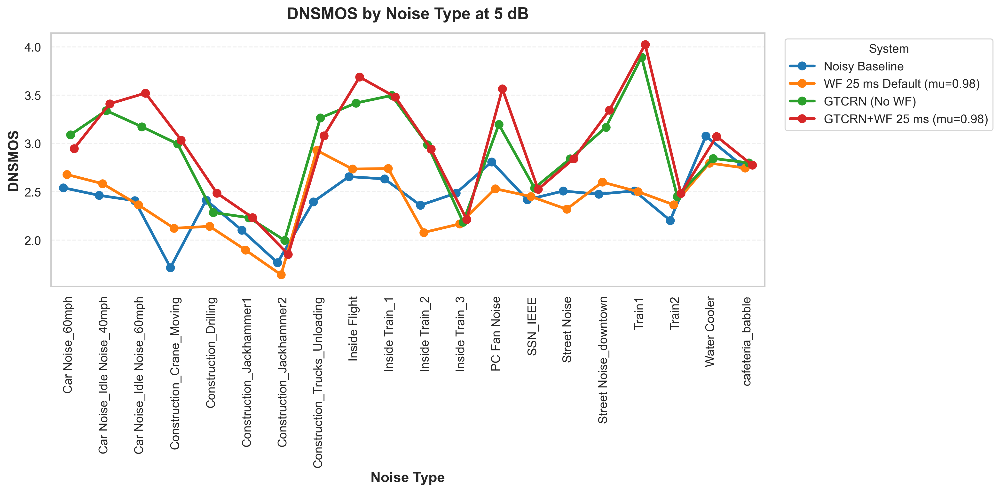

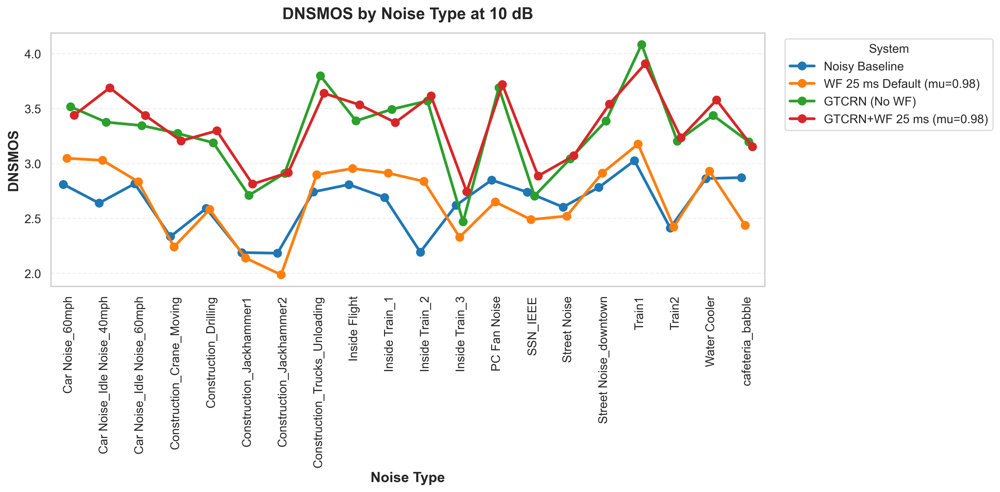

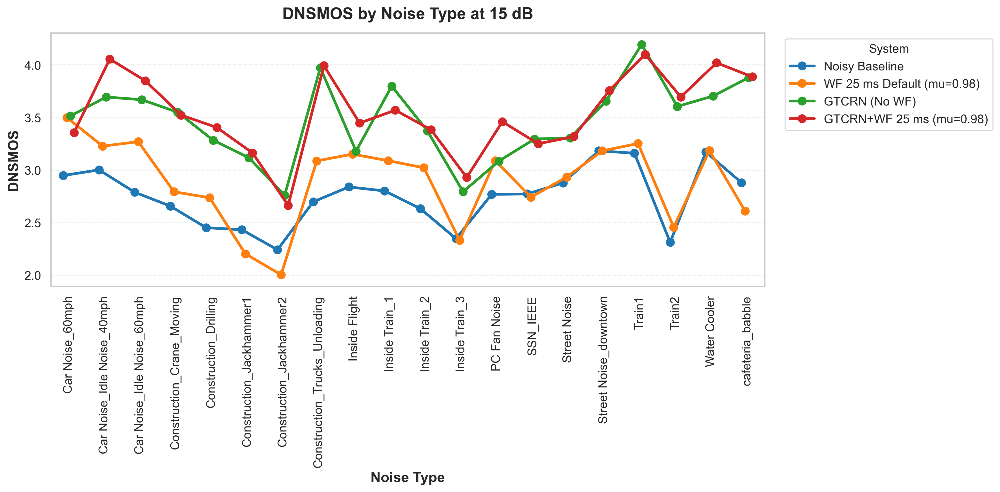

Generated 4 × 5 noise-type plots.


WindowsPath('c:/Users/kapun_63wn2un/Documents/ELEN4012 - Investigation/Repository/PROJECT-25P85/reports/figures/GTCRNWF_EXP3p2a_focus/noise_type_breakdown')

In [23]:
def plot_noise_type_breakdown(
    data: pd.DataFrame,
    metrics: List[str],
    snr_levels: List[int],
    label_order: List[str],
    save_dir: Optional[Path] = None,
) -> None:
    for metric in metrics:
        for snr in snr_levels:
            subset = data[data["SNR"] == snr]
            if subset.empty:
                continue
            fig, ax = plt.subplots(figsize=(14, 7))
            sns.pointplot(
                data=subset,
                x="noise_type",
                y=metric,
                hue="label",
                hue_order=label_order,
                palette="tab10",
                dodge=0.3,
                markers="o",
                linestyles='-',
                errorbar=None,
                ax=ax,
            )
            ax.set_title(f"{metric_display.get(metric, metric)} by Noise Type at {snr} dB", fontweight="bold", pad=14)
            ax.set_xlabel("Noise Type", fontweight="bold")
            ax.set_ylabel(metric_display.get(metric, metric), fontweight="bold")
            ax.tick_params(axis="x", labelrotation=90)
            plt.setp(ax.get_xticklabels(), ha="center")
            ax.grid(True, axis="y", alpha=0.3, linestyle="--")
            ax.legend(title="System", bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)
            plt.tight_layout()
            if save_dir is not None:
                save_dir.mkdir(parents=True, exist_ok=True)
                fig_path = save_dir / f"{metric}_noise_breakdown_{snr}dB.png"
                fig.savefig(fig_path, bbox_inches="tight")
            plt.show()
    print(f"Generated {len(metrics)} × {len(snr_levels)} noise-type plots.")

noise_fig_dir = figures_dir / "noise_type_breakdown"
plot_noise_type_breakdown(noise_breakdown, metrics_of_interest, snr_levels, label_order, save_dir=noise_fig_dir)
noise_fig_dir

## Best per Noise Type vs GTCRN

In [24]:
def best_by_noise_type_with_gain(reference_key: str) -> pd.DataFrame:
    reference_slice = noise_breakdown[noise_breakdown["experiment"] == reference_key].set_index(["noise_type", "SNR"])
    rows = []
    for noise, snr in noise_breakdown[["noise_type", "SNR"]].drop_duplicates().itertuples(index=False):
        noise_slice = noise_breakdown[(noise_breakdown["noise_type"] == noise) & (noise_breakdown["SNR"] == snr)]
        if noise_slice.empty:
            continue
        for metric in metrics_of_interest:
            best_idx = noise_slice[metric].idxmax()
            best_row = noise_slice.loc[best_idx]
            ref_value = np.nan
            if (noise, snr) in reference_slice.index:
                ref_value = reference_slice.loc[(noise, snr), metric]
            pct_gain = np.nan
            if pd.notnull(ref_value) and ref_value != 0:
                pct_gain = ((best_row[metric] - ref_value) / ref_value) * 100
            rows.append({
                "Noise Type": noise,
                "SNR (dB)": snr,
                "Metric": metric_display.get(metric, metric),
                "Best Config": label_lookup.get(best_row["experiment"], best_row["experiment"]),
                "Score": best_row[metric],
                "Reference": label_lookup.get(reference_key, reference_key),
                "Ref Score": ref_value,
                "Pct Gain (%)": pct_gain,
            })
    result = pd.DataFrame(rows)
    return result.sort_values(["Noise Type", "SNR (dB)", "Metric"])

best_noise_vs_gtcrn = best_by_noise_type_with_gain("GTCRN_EXP3p2a")
best_noise_vs_gtcrn.round({"Score": 3, "Ref Score": 3, "Pct Gain (%)": 1})

,Noise Type,SNR (dB),Metric,Best Config,Score,Reference,Ref Score,Pct Gain (%)
3,Car Noise_60mph,-5,DNSMOS,Noisy Baseline,2.621,GTCRN (No WF),2.558,2.5
0,Car Noise_60mph,-5,PESQ,GTCRN (No WF),1.220,GTCRN (No WF),1.220,0.0
2,Car Noise_60mph,-5,SI-SDR,GTCRN (No WF),4.988,GTCRN (No WF),4.988,0.0
1,Car Noise_60mph,-5,STOI,GTCRN (No WF),0.642,GTCRN (No WF),0.642,0.0
7,Car Noise_60mph,0,DNSMOS,GTCRN (No WF),2.733,GTCRN (No WF),2.733,0.0
...,...,...,...,...,...,...,...,...
393,cafeteria_babble,10,STOI,GTCRN (No WF),0.842,GTCRN (No WF),0.842,0.0
399,cafeteria_babble,15,DNSMOS,GTCRN+WF 25 ms (mu=0.98),3.887,GTCRN (No WF),3.880,0.2
396,cafeteria_babble,15,PESQ,GTCRN (No WF),2.145,GTCRN (No WF),2.145,0.0
398,cafeteria_babble,15,SI-SDR,GTCRN (No WF),17.933,GTCRN (No WF),17.933,0.0
